# TP3 - Template Matching


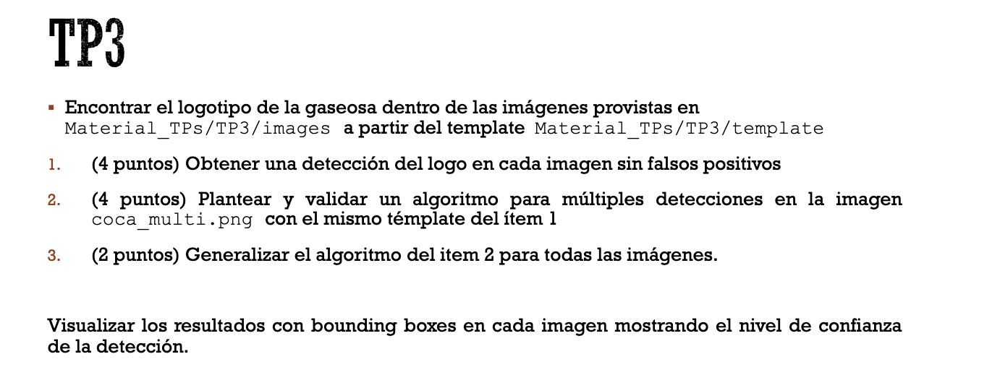


In [126]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

## 1. Preprocesamiento


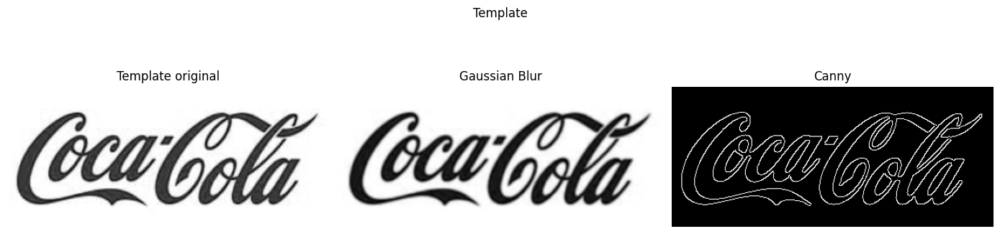

In [127]:
from pathlib import Path

BLUR_KERNEL = (5, 5)
CANNY_LOW = 50
CANNY_HIGH = 150


def preprocess(img_gray):
    blurred = cv.GaussianBlur(img_gray, BLUR_KERNEL, 0)
    return cv.Canny(blurred, CANNY_LOW, CANNY_HIGH)


template_gray = cv.imread("./template/pattern.png", 0)
template_blur = cv.GaussianBlur(template_gray, BLUR_KERNEL, 0)
template = cv.Canny(template_blur, CANNY_LOW, CANNY_HIGH)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for ax, img, title in zip(
    axes,
    [template_gray, template_blur, template],
    ["Template original", "Gaussian Blur", "Canny"],
):
    ax.imshow(img, cmap="gray")
    ax.set_title(title)
    ax.axis("off")
fig.suptitle("Template")
plt.tight_layout()
plt.show()

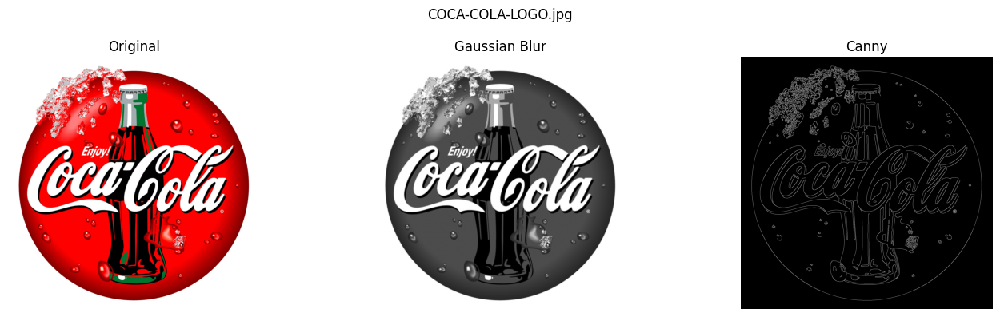

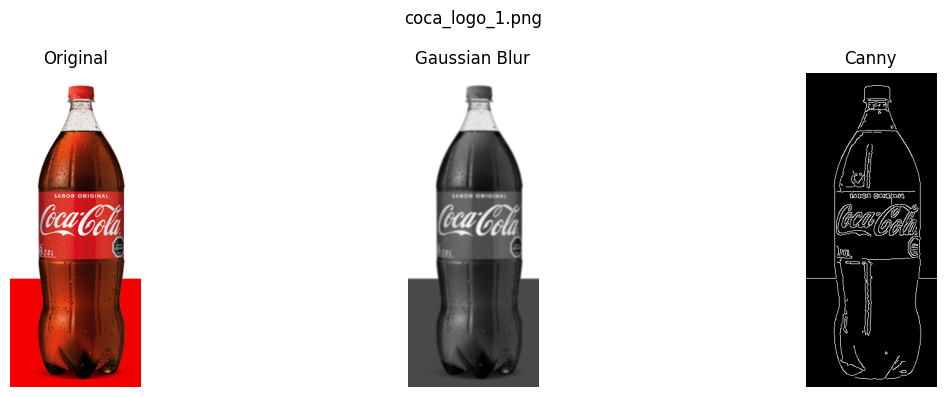

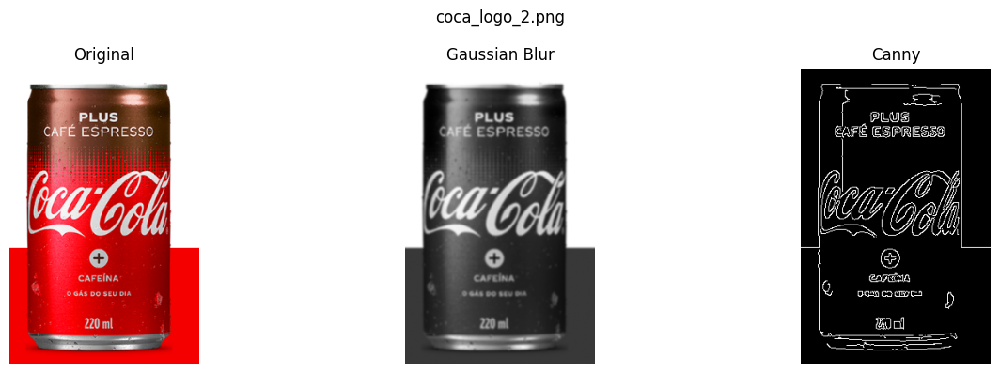

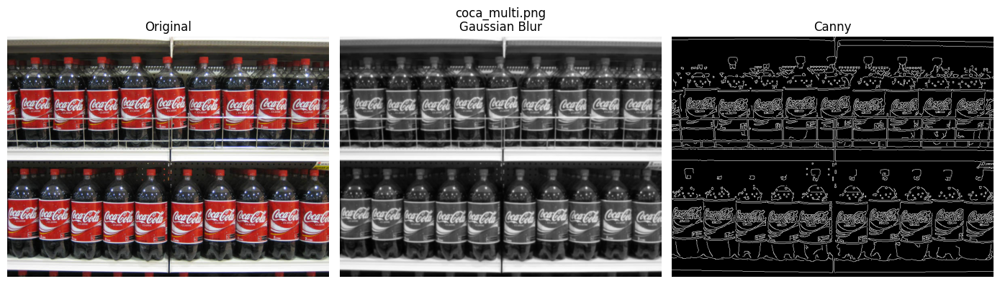

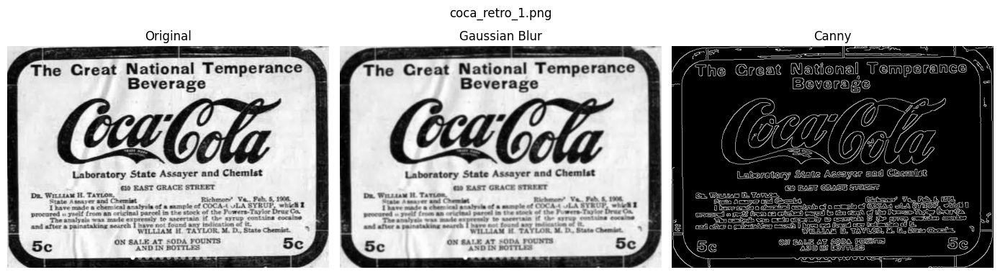

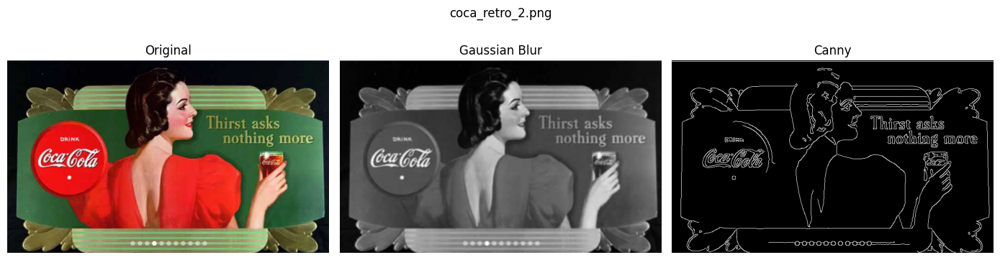

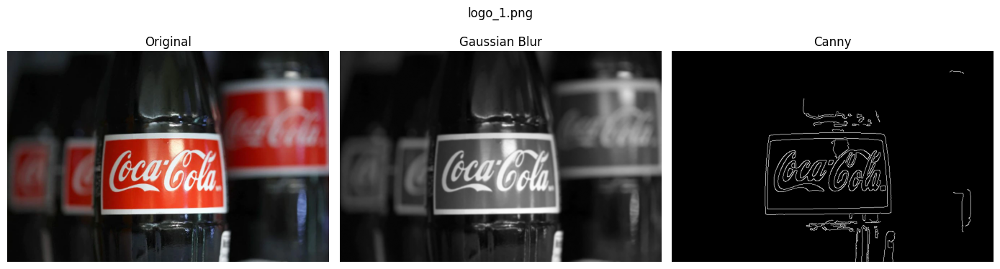

In [128]:
for img_path in sorted(Path("./images").iterdir()):
    if img_path.suffix.lower() not in [".png", ".jpg"]:
        continue
    img = cv.imread(str(img_path))
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    img_blur = cv.GaussianBlur(img_gray, BLUR_KERNEL, 0)
    img_edges = cv.Canny(img_blur, CANNY_LOW, CANNY_HIGH)

    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    axes[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    axes[0].set_title("Original")
    axes[0].axis("off")
    axes[1].imshow(img_blur, cmap="gray")
    axes[1].set_title("Gaussian Blur")
    axes[1].axis("off")
    axes[2].imshow(img_edges, cmap="gray")
    axes[2].set_title("Canny")
    axes[2].axis("off")
    fig.suptitle(img_path.name)
    plt.tight_layout()
    plt.show()

## 2. Template Matching


Template matching no tiene nocion de escalas, si el logo en una foto es de diferente tamaño que el template la correlación falla.


In [129]:
METHOD = cv.TM_CCOEFF_NORMED


# Hay imagenes que son mas pequeñas que el template. Esta funcion escala la imagen en un rango determinado y se retorna el mejor match
def multiscale_match(img_gray, template, method=METHOD, n_scales=30):
    """Escala la imagen y aplica preprocess() antes de matchTemplate."""
    th, tw = template.shape[:2]
    ih, iw = img_gray.shape[:2]
    min_scale = max(th / ih, tw / iw)
    max_scale = max(min_scale, 1.0) * 4

    is_sqdiff = method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]
    best_val = np.inf if is_sqdiff else -np.inf
    best = None

    for scale in np.linspace(min_scale, max_scale, n_scales):
        new_h, new_w = int(ih * scale), int(iw * scale)
        if new_h < th or new_w < tw:
            continue
        img_sc = preprocess(cv.resize(img_gray, (new_w, new_h)))
        res = cv.matchTemplate(img_sc, template, method)
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
        val = min_val if is_sqdiff else max_val
        loc = min_loc if is_sqdiff else max_loc
        if (is_sqdiff and val < best_val) or (not is_sqdiff and val > best_val):
            best_val = val
            best = (
                val,
                (int(loc[0] / scale), int(loc[1] / scale)),
                int(tw / scale),
                int(th / scale),
            )
    return best  # (val, (x,y), bw, bh)  o  None


def nms_match(img_gray, template, method=METHOD, threshold=0.6, n_scales=30):
    """Múltiples detecciones: mejor escala → NMS.

    threshold es relativo al mejor score encontrado: se aceptan detecciones
    con score >= best_val * threshold (para TM_CCOEFF_NORMED). Esto hace que
    el umbral sea independiente del rango absoluto de scores (bordes Canny
    producen scores mucho más bajos que intensidad cruda).
    """
    th, tw = template.shape[:2]
    ih, iw = img_gray.shape[:2]
    min_scale = max(th / ih, tw / iw)
    max_scale = max(min_scale, 1.0) * 4

    is_sqdiff = method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]
    best_val = np.inf if is_sqdiff else -np.inf
    best_scale, best_res = None, None

    for scale in np.linspace(min_scale, max_scale, n_scales):
        new_h, new_w = int(ih * scale), int(iw * scale)
        if new_h < th or new_w < tw:
            continue
        img_sc = preprocess(cv.resize(img_gray, (new_w, new_h)))
        res = cv.matchTemplate(img_sc, template, method)
        min_val, max_val, _, _ = cv.minMaxLoc(res)
        val = min_val if is_sqdiff else max_val
        if (is_sqdiff and val < best_val) or (not is_sqdiff and val > best_val):
            best_val = val
            best_scale = scale
            best_res = res

    if best_res is None:
        return [], 0, 0

    # Umbral absoluto derivado del mejor score encontrado
    if is_sqdiff:
        abs_threshold = best_val / threshold
    else:
        abs_threshold = best_val * threshold  # e.g. 0.118 * 0.6 = 0.071

    bw, bh = int(tw / best_scale), int(th / best_scale)
    res_copy = best_res.copy()
    detections = []

    while True:
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res_copy)
        val = min_val if is_sqdiff else max_val
        loc = min_loc if is_sqdiff else max_loc
        if (is_sqdiff and val > abs_threshold) or (
            not is_sqdiff and val < abs_threshold
        ):
            break
        x, y = loc
        detections.append(((int(x / best_scale), int(y / best_scale)), val))
        y1 = max(0, y - th // 2)
        y2 = min(res_copy.shape[0], y + th // 2)
        x1 = max(0, x - tw // 2)
        x2 = min(res_copy.shape[1], x + tw // 2)
        res_copy[y1:y2, x1:x2] = 1.0 if is_sqdiff else 0.0

    return detections, bw, bh

## 1 — Detección única por imagen


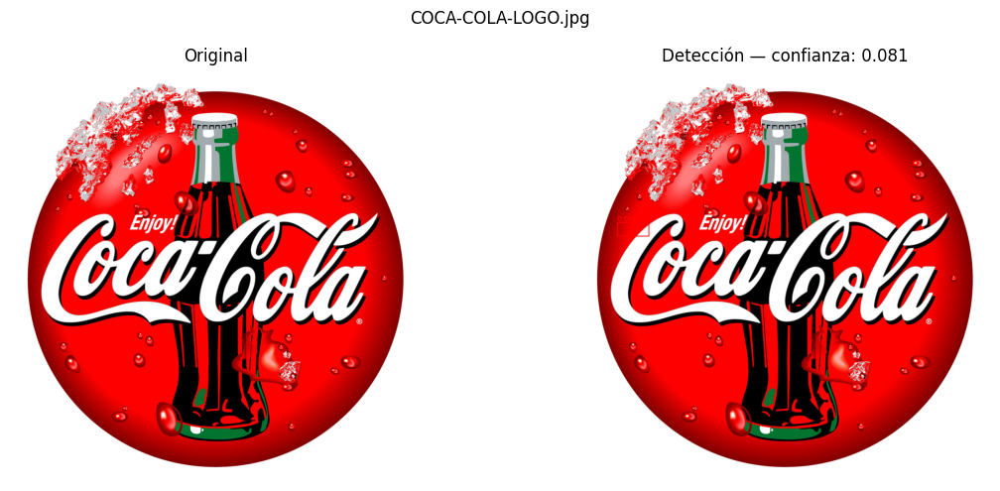

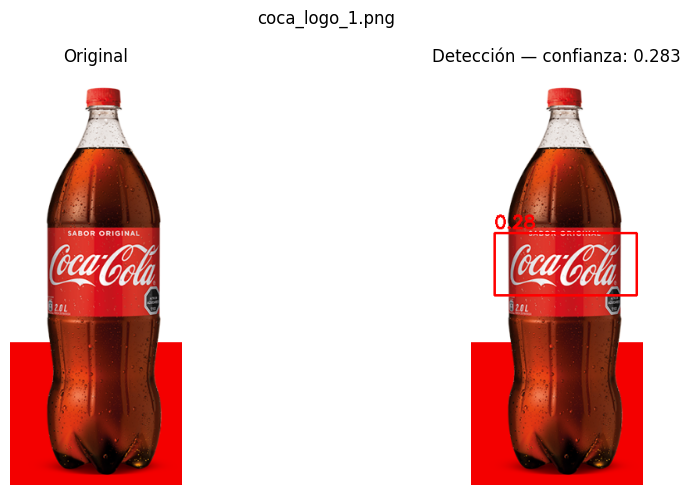

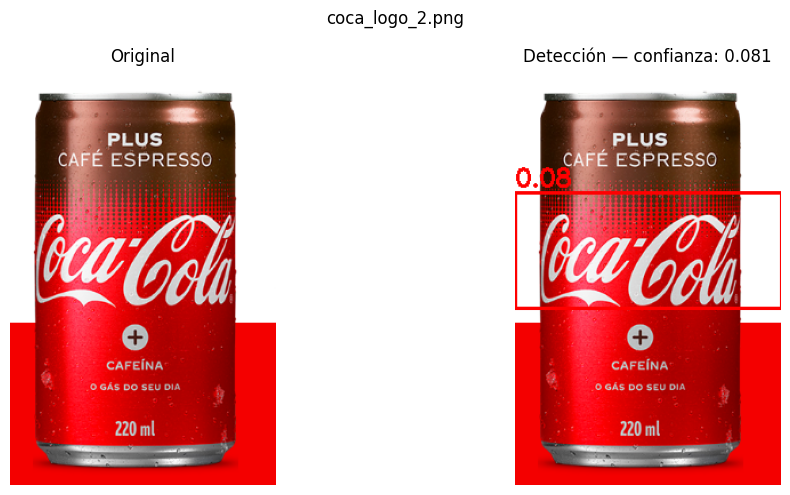

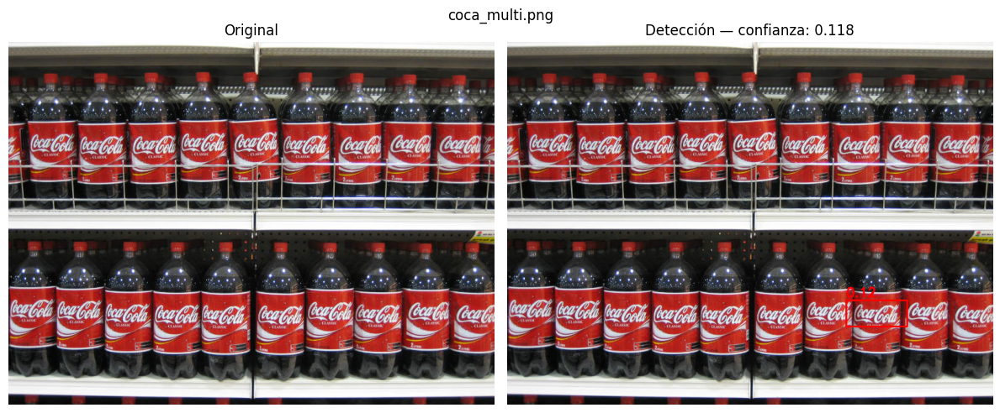

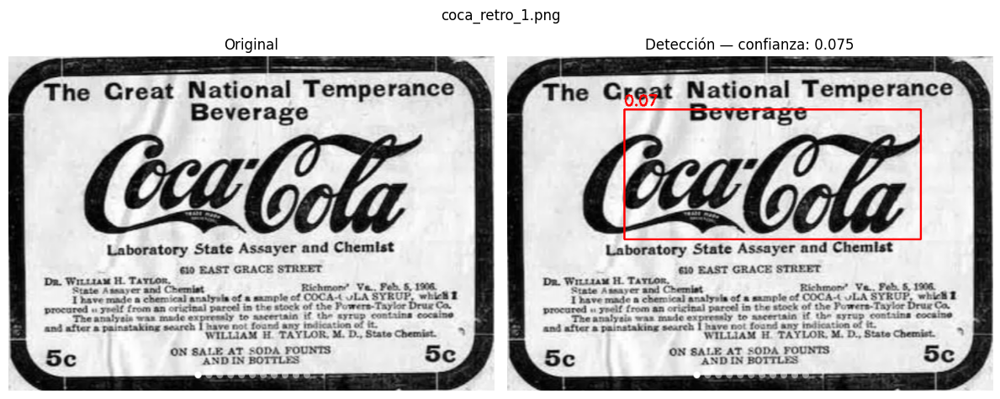

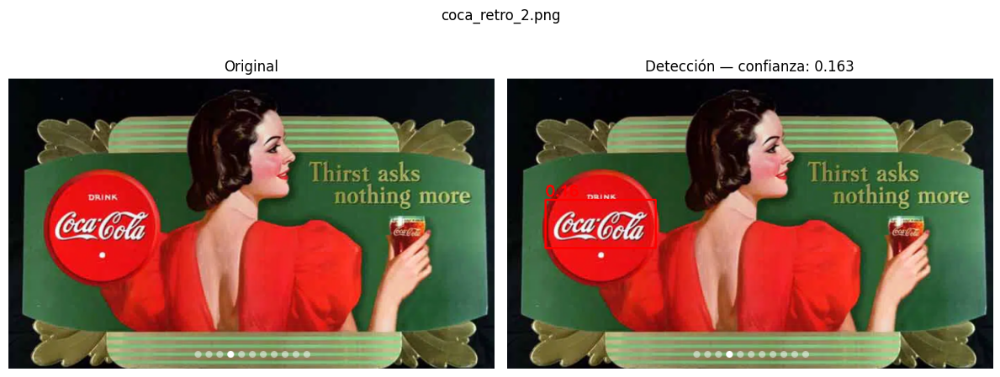

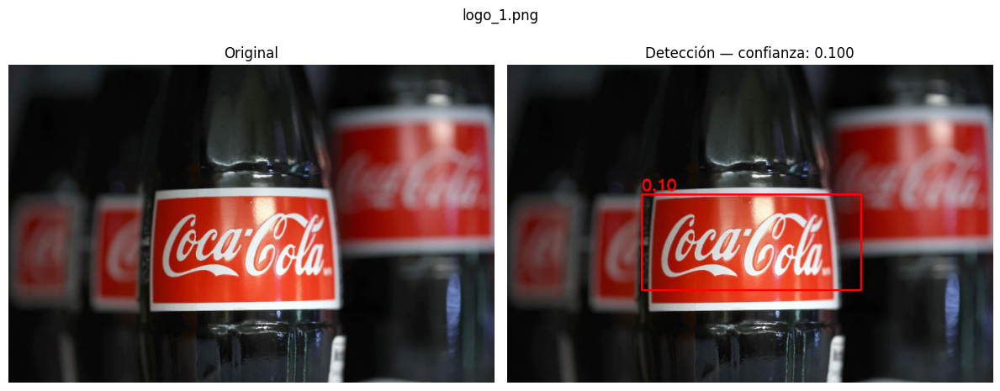

In [130]:
scores = (
    {}
)  # confianza de la mejor detección por imagen (se grafica en la celda siguiente)
for img_path in sorted(Path("./images").iterdir()):
    if img_path.suffix.lower() not in [".png", ".jpg"]:
        continue

    img = cv.imread(str(img_path))
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    result = multiscale_match(img_gray, template)
    if result is None:
        scores[img_path.name] = 0.0
        print(f"{img_path.name}: no match encontrado")
        continue

    val, (x, y), bw, bh = result
    scores[img_path.name] = val
    img_out = img_rgb.copy()
    cv.rectangle(img_out, (x, y), (x + bw, y + bh), (255, 0, 0), 2)
    cv.putText(
        img_out,
        f"{val:.2f}",
        (x, max(y - 6, 10)),
        cv.FONT_HERSHEY_SIMPLEX,
        0.7,
        (255, 0, 0),
        2,
    )

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(img_rgb)
    axes[0].set_title("Original")
    axes[0].axis("off")
    axes[1].imshow(img_out)
    axes[1].set_title(f"Detección — confianza: {val:.3f}")
    axes[1].axis("off")
    fig.suptitle(img_path.name)
    plt.tight_layout()
    plt.show()

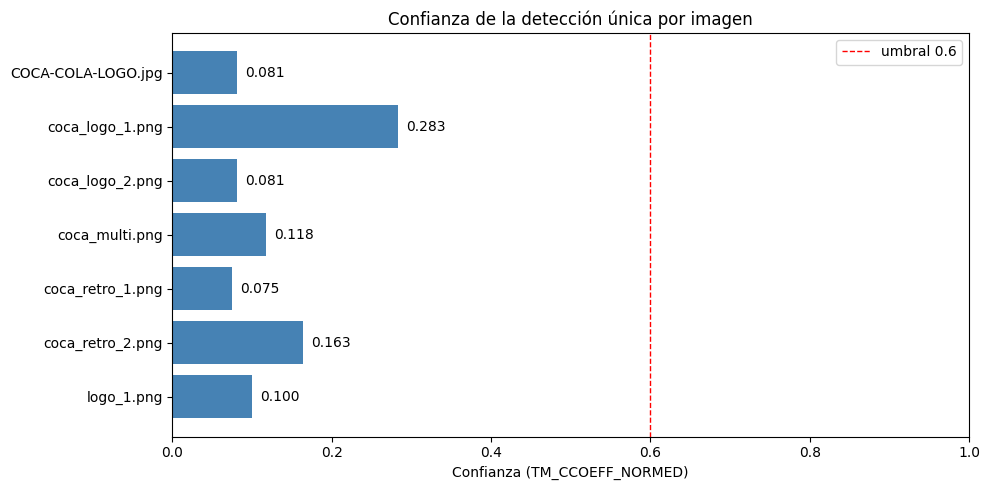

In [131]:
# Visualización de las confianzas de la detección única (TM_CCOEFF_NORMED).
# Usa los scores ya calculados en la celda anterior; no re-corre el matching.
names = list(scores.keys())
vals = [scores[n] for n in names]

fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.barh(names, vals, color="steelblue")
ax.invert_yaxis()  # primera imagen arriba
ax.set_xlim(0, 1)
ax.set_xlabel("Confianza (TM_CCOEFF_NORMED)")
ax.set_title("Confianza de la detección única por imagen")
ax.axvline(0.6, color="red", linestyle="--", linewidth=1, label="umbral 0.6")
for bar, v in zip(bars, vals):
    ax.text(v + 0.01, bar.get_y() + bar.get_height() / 2, f"{v:.3f}", va="center")
ax.legend()
plt.tight_layout()
plt.show()

Vemos que el score de detección es relativamente bajo fallando en encontrar el template en la primera imagen y en la imagen con multiples logos.

Previamente se hizo un experimento solamente con gradientes de intensidad en el procesamiento, el score subió bastante pero irónicamente el match era peor.


## 2 — Múltiples detecciones en `coca_multi.png`


Detecciones encontradas: 15


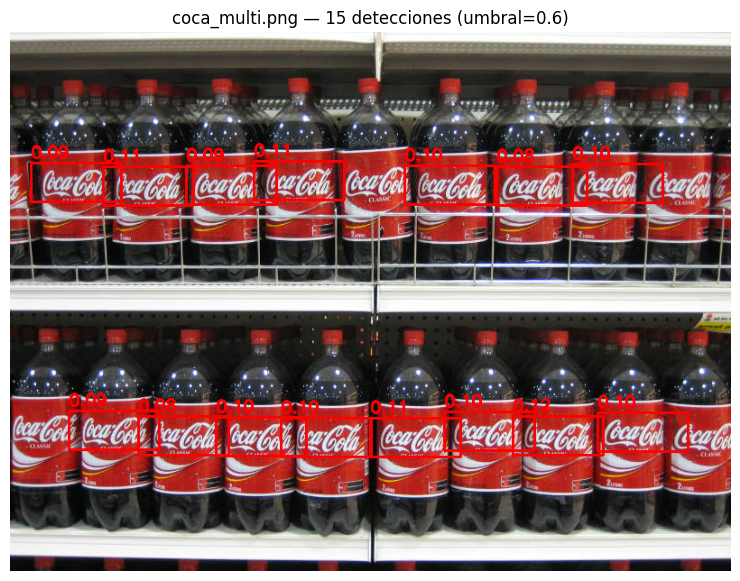

In [132]:
img = cv.imread("./images/coca_multi.png")
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

THRESHOLD = 0.6  # ajustar si hay falsos positivos / negativos

detections, tw, th = nms_match(img_gray, template, threshold=THRESHOLD)

img_out = img_rgb.copy()
for (x, y), val in detections:
    cv.rectangle(img_out, (x, y), (x + tw, y + th), (255, 0, 0), 2)
    cv.putText(
        img_out,
        f"{val:.2f}",
        (x, max(y - 6, 10)),
        cv.FONT_HERSHEY_SIMPLEX,
        0.6,
        (255, 0, 0),
        2,
    )

print(f"Detecciones encontradas: {len(detections)}")
plt.figure(figsize=(10, 7))
plt.imshow(img_out)
plt.title(f"coca_multi.png — {len(detections)} detecciones (umbral={THRESHOLD})")
plt.axis("off")
plt.show()

## 3 - Múltiples detecciones generalizadas para todas las imágenes


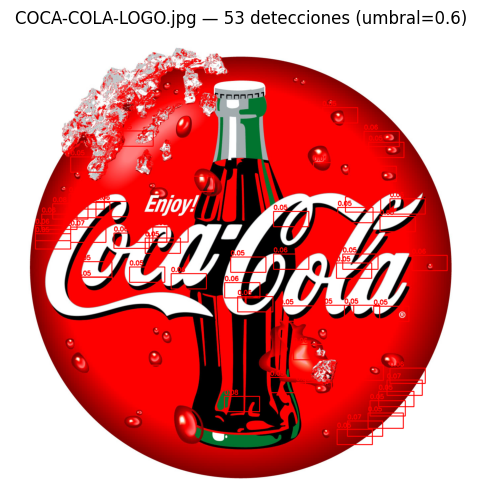

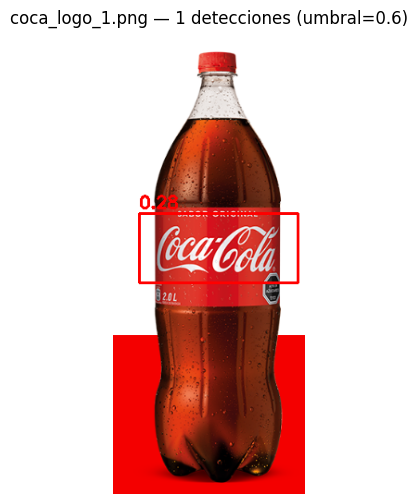

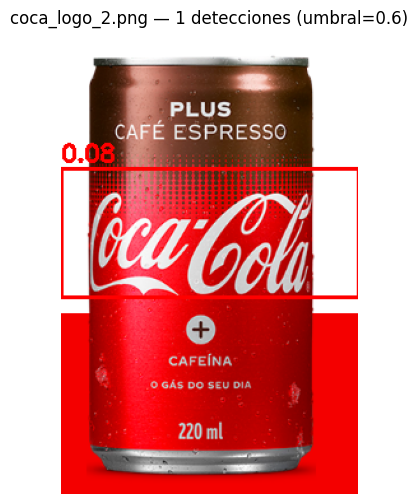

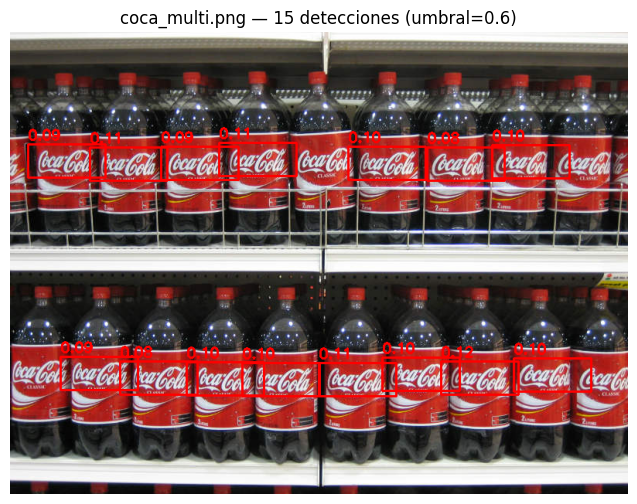

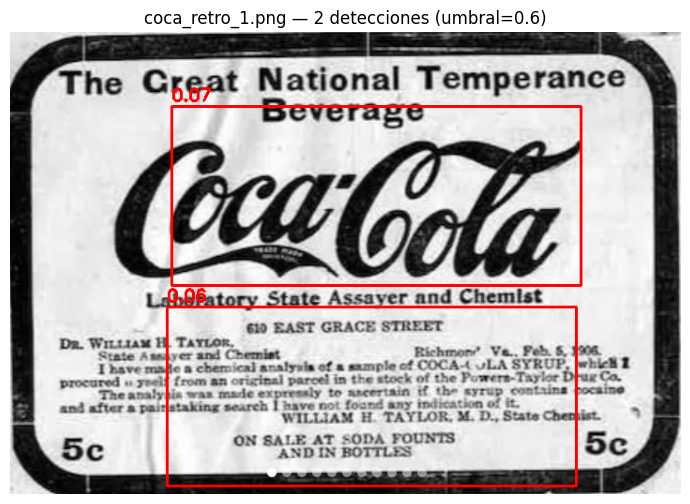

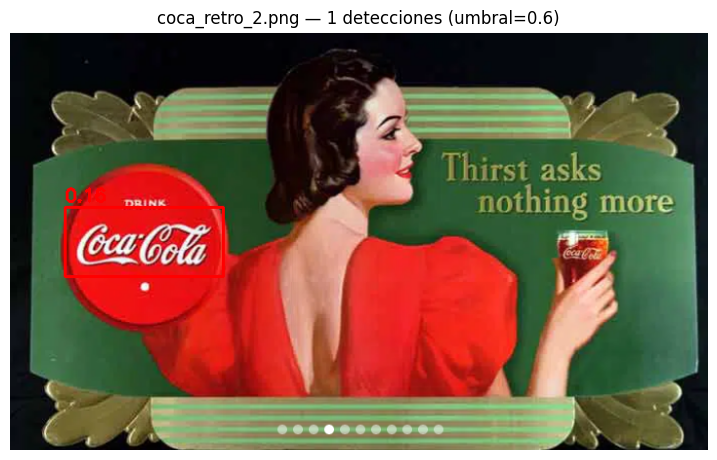

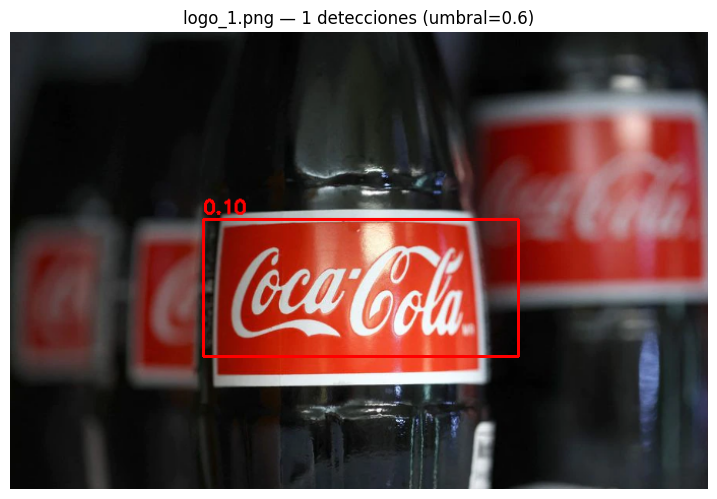

In [133]:
THRESHOLD = 0.6  # ajustar si hay falsos positivos / negativos

for img_path in sorted(Path("./images").iterdir()):
    if img_path.suffix.lower() not in [".png", ".jpg"]:
        continue

    img = cv.imread(str(img_path))
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    detections, tw, th = nms_match(img_gray, template, threshold=THRESHOLD)

    img_out = img_rgb.copy()
    for (x, y), val in detections:
        cv.rectangle(img_out, (x, y), (x + tw, y + th), (255, 0, 0), 2)
        cv.putText(
            img_out,
            f"{val:.2f}",
            (x, max(y - 6, 10)),
            cv.FONT_HERSHEY_SIMPLEX,
            0.6,
            (255, 0, 0),
            2,
        )

    plt.figure(figsize=(9, 6))
    plt.imshow(img_out)
    plt.title(f"{img_path.name} — {len(detections)} detecciones (umbral={THRESHOLD})")
    plt.axis("off")
    plt.show()

# Comentarios

Las secciones anteriores corren `cv.matchTemplate` sobre mapas de bordes de **Canny**, y las confianzas resultantes son muy bajas (~0.08–0.28, cuando un buen match en `TM_CCOEFF_NORMED` debería rondar 0.7–1.0). El problema es doble:

1. **Matchear sobre bordes es frágil.** `matchTemplate` es una correlación deslizante; sobre bordes binarios de 1 px de ancho, cualquier desalineación, error de escala o pequeña rotación hace que los bordes no se solapen y la correlación cae a ~0. A pesar, de que se implemento una logica de escalamiento los resultados no son muy buenos en ciertas imagenes, en otras, el match es perfecto.
2. **El template está en polaridad invertida.** El logo del template es _rojo sobre blanco_, pero en casi todas las fotos aparece _blanco sobre rojo_, lo que degrada tanto la correlación de intensidad como los descriptores de features. Esto no es un problema en si para Canny pero si para otras tecnicas de procesamiento al hacer un contraste de intensidad.

A continuación, dos mejoras:

- **(A)** un A/B que aísla el efecto de matchear sobre **bordes vs. intensidad**, manteniendo todo lo demás igual.
- **(B)** un detector robusto basado en **features (SIFT) + homografía con RANSAC**, que es la técnica adecuada para localizar un logo bajo cambios de escala, rotación y perspectiva.


### A — A/B: `matchTemplate` sobre bordes (Canny) vs. intensidad (gris)

Misma búsqueda multiescala que las secciones anteriores; lo único que cambia es el preprocesamiento del input. Comparamos la mejor confianza por imagen.


In [134]:
# A/B: matchTemplate sobre bordes (Canny) vs. sobre intensidad (gris).
# Misma búsqueda multiescala; sólo cambia el preprocesamiento. Aísla el efecto
# de matchear sobre bordes vs. intensidad.


def best_conf(img_gray, tmpl, prep, n_scales=40):
    ih, iw = img_gray.shape
    tH, tW = tmpl.shape
    min_scale = max(tH / ih, tW / iw)
    max_scale = max(min_scale, 1.0) * 4
    best = -np.inf
    for scale in np.linspace(min_scale, max_scale, n_scales):
        nh, nw = int(ih * scale), int(iw * scale)
        if nh < tH or nw < tW:
            continue
        res = cv.matchTemplate(prep(cv.resize(img_gray, (nw, nh))), tmpl, METHOD)
        best = max(best, cv.minMaxLoc(res)[1])
    return best


identity = lambda x: x  # noqa: E731  (sin preprocesamiento, intensidad cruda)

print(f"{'imagen':28s} {'Canny':>8s} {'Gris':>8s}")
for img_path in sorted(Path("./images").iterdir()):
    if img_path.suffix.lower() not in [".png", ".jpg"]:
        continue
    g = cv.cvtColor(cv.imread(str(img_path)), cv.COLOR_BGR2GRAY)
    c_canny = best_conf(g, template, preprocess)  # template ya es Canny
    c_gray = best_conf(g, template_gray, identity)  # template_gray es intensidad
    print(f"{img_path.name:28s} {c_canny:8.3f} {c_gray:8.3f}")

imagen                          Canny     Gris
COCA-COLA-LOGO.jpg              0.092    0.355
coca_logo_1.png                 0.186    0.341
coca_logo_2.png                 0.081    0.370
coca_multi.png                  0.118    0.395
coca_retro_1.png                0.107    0.659
coca_retro_2.png                0.165    0.371
logo_1.png                      0.106    0.390


Aqui podemos ver que usar intensidad en escala de grises (sin preprocesamiento) da mejores scores de confianza, a pesar de ello, aun son un poco bajos. MatchTemplate no da buenos resultados sin importar el preprocesamiento.

A pesar de que hay mejores scores, de hecho se intentó cambiando el preprocesamiento pero ironicamente el matching fue peor.

Veamos el comportamiento de SIFT junto con homografia


### B — Detector robusto: features (SIFT) + homografía con RANSAC

`matchTemplate` sólo es invariante a traslación. Para detectar el logo bajo cambios de **escala, rotación y perspectiva** la técnica adecuada es emparejar _keypoints_ (SIFT) y estimar una homografía con **RANSAC**. Se usa el template en **ambas polaridades** para cubrir el logo rojo-sobre-blanco y blanco-sobre-rojo. La caja proyectada puede ser un cuadrilátero (no sólo un rectángulo), reflejando la perspectiva real del logo en la escena.


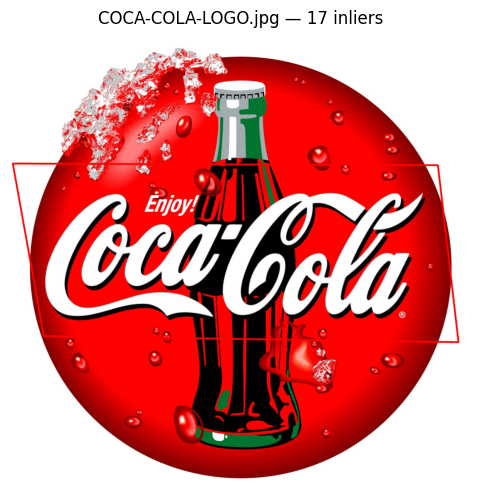

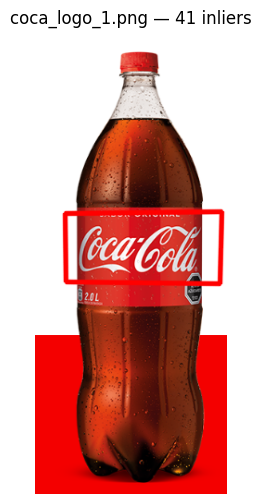

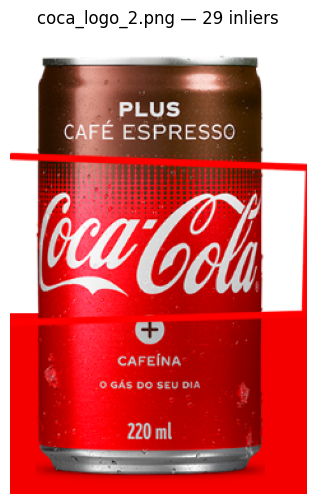

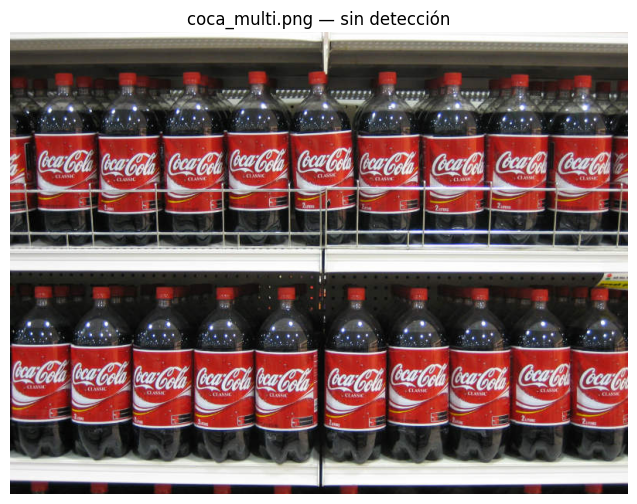

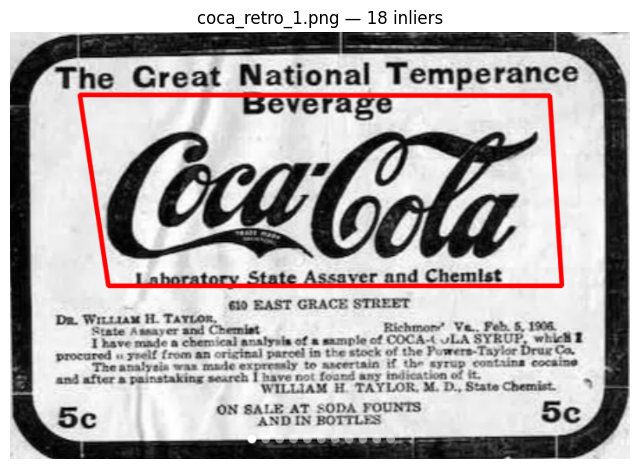

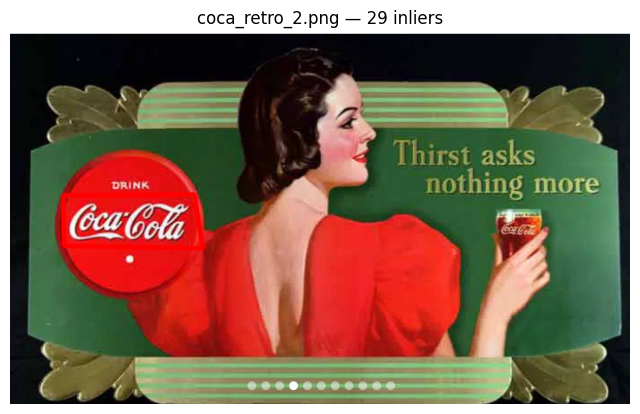

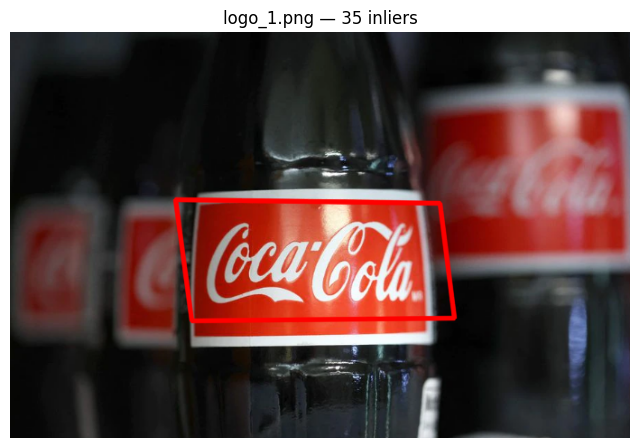

In [135]:
detector = cv.SIFT_create()
matcher = cv.BFMatcher(cv.NORM_L2)
RATIO = 0.75  # test de ratio de Lowe
MIN_INLIERS = 8  # inliers mínimos para aceptar la detección

# Keypoints/descriptores del template en ambas polaridades (precomputados)
templates_kp = []
for t in [template_gray, 255 - template_gray]:
    kp, des = detector.detectAndCompute(t, None)
    templates_kp.append((t, kp, des))


def detect_logo(img_gray):
    """Devuelve (inliers, caja_cuadrilatero) o None."""
    kq, dq = detector.detectAndCompute(img_gray, None)
    if dq is None:
        return None

    best = None
    for t, kp, des in templates_kp:
        matches = matcher.knnMatch(des, dq, k=2)
        good = [a for a, b in matches if a.distance < RATIO * b.distance]
        if len(good) < 4:
            continue
        src = np.float32([kp[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst = np.float32([kq[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
        H, mask = cv.findHomography(src, dst, cv.RANSAC, 5.0)
        if H is None:
            continue
        inliers = int(mask.sum())
        if best is None or inliers > best[0]:
            h, w = t.shape
            corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
            box = cv.perspectiveTransform(corners, H)
            best = (inliers, box)

    if best is None or best[0] < MIN_INLIERS:
        return None
    return best


for img_path in sorted(Path("./images").iterdir()):
    if img_path.suffix.lower() not in [".png", ".jpg"]:
        continue

    img = cv.imread(str(img_path))
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    res = detect_logo(img_gray)
    img_out = img_rgb.copy()
    if res is None:
        title = "sin detección"
    else:
        inliers, box = res
        cv.polylines(img_out, [np.int32(box)], True, (255, 0, 0), 3, cv.LINE_AA)
        title = f"{inliers} inliers"

    plt.figure(figsize=(8, 6))
    plt.imshow(img_out)
    plt.title(f"{img_path.name} — {title}")
    plt.axis("off")
    plt.show()

Se puede observar un excelente rendimiento en todas las imagenes con excepcion de la imagen con multiples logos de coca cola:

- Direccion del match: El ratio test de Lowe rechaza casi todos los matches ya que los inliers encontrados son menos al minimo.
- `findHomography` asume una unica instancia plana del logo, pero en esta imagen hay varios.

Veamos otra tecnica para detección múltiple.


Matches totales tras ratio test: 512


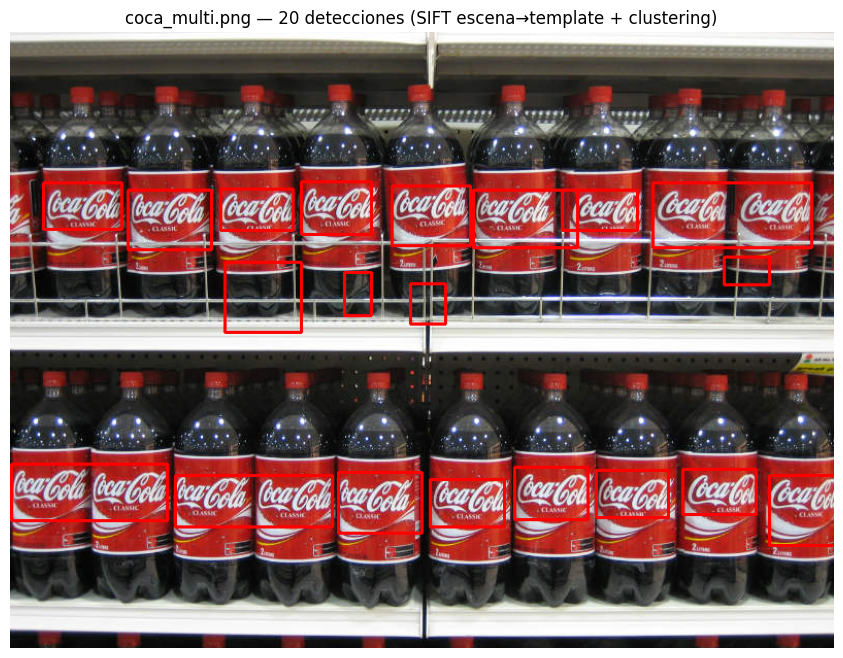

In [ ]:
# La homografía asume UNA sola instancia plana; en su lugar agrupamos los
# keypoints de la escena que matchearon con el template — cada cluster es un logo.

from sklearn.cluster import DBSCAN

img = cv.imread("./images/coca_multi.png")
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

kq, dq = detector.detectAndCompute(img_gray, None)

# Acumular matches de ambas polaridades del template (escena - template)
all_pts = []
for _, kp_t, des_t in templates_kp:
    matches = matcher.knnMatch(dq, des_t, k=2)  # <-- dq primero (escena -> template)
    good = [a for a, b in matches if a.distance < RATIO * b.distance]
    all_pts.extend(
        [kq[a.queryIdx].pt for a in good]
    )  # queryIdx = keypoint de la escena

print(f"Matches totales tras ratio test: {len(all_pts)}")

if len(all_pts) < 3:
    print("Sin suficientes matches")
else:
    pts = np.float32(all_pts)
    # prueba y error eps y min samples
    clustering = DBSCAN(eps=25, min_samples=3).fit(pts)

    img_out = img_rgb.copy()
    n_det = 0
    for label in set(clustering.labels_):
        if label == -1:  # puntos de ruido
            continue
        cluster_pts = pts[clustering.labels_ == label]
        x1, y1 = cluster_pts.min(axis=0).astype(int)
        x2, y2 = cluster_pts.max(axis=0).astype(int)
        pad = 10
        cv.rectangle(
            img_out, (x1 - pad, y1 - pad), (x2 + pad, y2 + pad), (255, 0, 0), 2
        )
        n_det += 1

    plt.figure(figsize=(12, 8))
    plt.imshow(img_out)
    plt.title(
        f"coca_multi.png — {n_det} detecciones (SIFT escena→template + clustering)"
    )
    plt.axis("off")
    plt.show()

Se obtuvo un muy buen rendimiento a pesar de unos cuantos falsos positivos.
